# Visualize Olympics

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import rasterio as rio
import matplotlib.pyplot as plt
import xarray as xr
from datetime import datetime
import matplotlib
import ipyleaflet
import sys
import os
import dask_gateway
import planetary_computer
sys.path.append('../sar_snowmelt_timing')
import s1_rtc_bs_utils
import contextily as ctx
import rioxarray as rxr
import pathlib
import glob
import re
from matplotlib.pyplot import cm
import scipy

In [2]:
names = ['Olympics']

geojsons = ['../input/shapefiles/olympics.geojson']

In [3]:
# for nm in names:
#     geotiff_list = glob.glob(f'../output/{nm}/runoff_onset_*_2*.tif')
    
#     year_list = []
#     for geotiff in geotiff_list:
#         year_list.append(re.search("([0-9]{4})", geotiff).group(0))
#     year_list = [int(year) for year in year_list]

#  #Create variable used for time axis
#     time_var = xr.Variable('time', year_list)

# # Load in and concatenate all individual GeoTIFFs
#     runoffs_allyears = xr.concat([rxr.open_rasterio(i) for i in geotiff_list],dim=time_var).squeeze().sortby('time')
    
#     runoffs_allyears.plot(col='time')

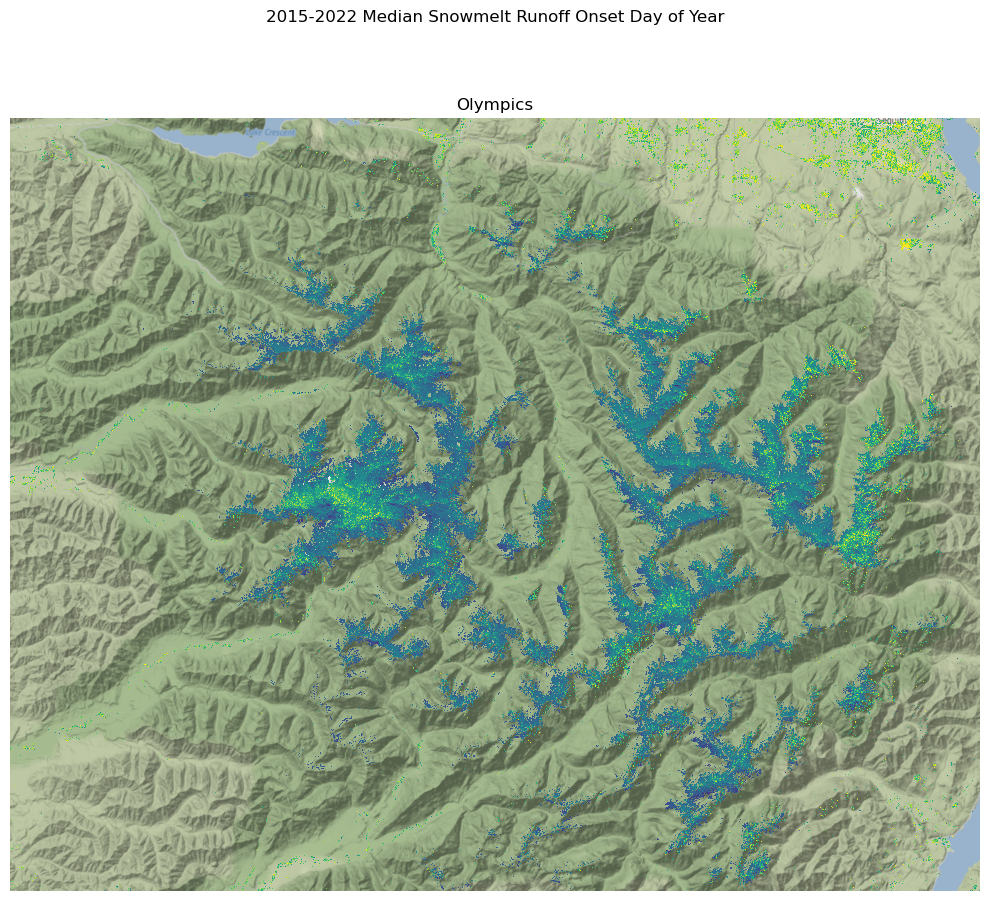

In [4]:
f,ax = plt.subplots(figsize=(10,10))

for nm in names:
    filename = glob.glob(f'../output/{nm}/*allyears_median*.tif')
    plots = rxr.open_rasterio(filename[0])
    plots.plot(ax=ax,vmin=50,vmax=250,add_colorbar=False)
    ax.set_title(f'{nm}')
    ax.set_aspect('equal')
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.axis('off')
    ctx.add_basemap(ax=ax, crs=plots.rio.crs, source=ctx.providers.Stamen.Terrain, attribution=False)
f.suptitle(f'2015-2022 Median Snowmelt Runoff Onset Day of Year')
f.tight_layout()

In [5]:
for nm in names:
    filename_dem = glob.glob(f'../output/{nm}/*dem*.tif')
    dem = rxr.open_rasterio(filename_dem[0]).squeeze()
    dem = dem.where(dem>1250)
    
    filename_median = glob.glob(f'../output/{nm}/*allyears_median*.tif')
    median_runoff = rxr.open_rasterio(filename_median[0]).squeeze().where(dem>1250)
    
    filename_aspect = glob.glob(f'../output/{nm}/*aspect*.tif')
    aspect = rxr.open_rasterio(filename_aspect[0]).squeeze().where(median_runoff>-1)
    
    filename_slope = glob.glob(f'../output/{nm}/*slope*.tif')
    slope = rxr.open_rasterio(filename_slope[0]).squeeze().where(median_runoff>-1)
        
    stats_df = pd.DataFrame(columns=['runoff_dates','elevation','aspect','slope'])
    stats_df['runoff_dates'] = median_runoff.data.reshape(-1)
    stats_df['elevation'] = dem.data.reshape(-1)
    stats_df['aspect'] = aspect.data.reshape(-1)
    stats_df['slope'] = slope.data.reshape(-1)
    stats_df = stats_df.dropna()
                 
    predictors = np.append(np.ones_like([stats_df['runoff_dates']]).T,stats_df.loc[:,['elevation']].to_numpy(),axis=1)
    B,_,_,_ = scipy.linalg.lstsq(predictors, stats_df.loc[:,'runoff_dates'])
    print(f'For {nm} during 2015-2022, the average runoff onset date is predicted {B[1]*100:.2f} days later for every 100m of elevation gain.')
    print(stats_df.corr())
    print(f'---------------------------------------------------------------------------------------------------------------------------')

For Olympics during 2015-2022, the average runoff onset date is predicted 4.29 days later for every 100m of elevation gain.
              runoff_dates  elevation    aspect     slope
runoff_dates      1.000000   0.326577 -0.049408  0.199931
elevation         0.326577   1.000000  0.010067  0.156196
aspect           -0.049408   0.010067  1.000000 -0.030806
slope             0.199931   0.156196 -0.030806  1.000000
---------------------------------------------------------------------------------------------------------------------------


Processing Olympics...


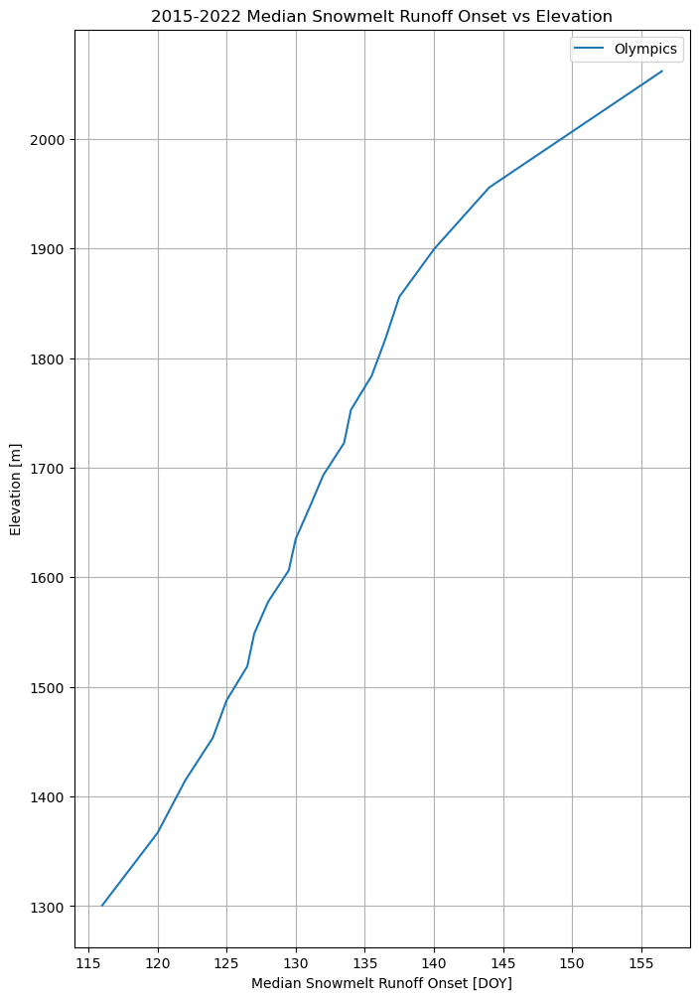

In [6]:
f,ax=plt.subplots(figsize=(8,12))
for nm in names:
    print(f'Processing {nm}...')
    filename_median = glob.glob(f'../output/{nm}/*allyears_median*.tif')
    median_runoff = rxr.open_rasterio(filename_median[0]).squeeze()
    filename_dem = glob.glob(f'../output/{nm}/*dem*.tif')
    dem = rxr.open_rasterio(filename_dem[0]).squeeze().where(median_runoff>-1)
    dem = dem.where(dem>1250)
    median_runoff = median_runoff.where(dem>1250)
    dem_and_runoff_df = pd.DataFrame((dem.to_numpy().ravel(),median_runoff.to_numpy().ravel())).T.dropna()
    dem_and_runoff_df.columns = ['Elevation','Runoff DOY']

    dem_and_runoff_df.groupby(pd.qcut(dem_and_runoff_df["Elevation"], 20)).median().plot(ax=ax,x='Runoff DOY',y='Elevation',label=f'{nm}')

ax.set_title(f'2015-2022 Median Snowmelt Runoff Onset vs Elevation')
ax.set_xlabel(f'Median Snowmelt Runoff Onset [DOY]')
ax.set_ylabel(f'Elevation [m]')    
ax.grid()

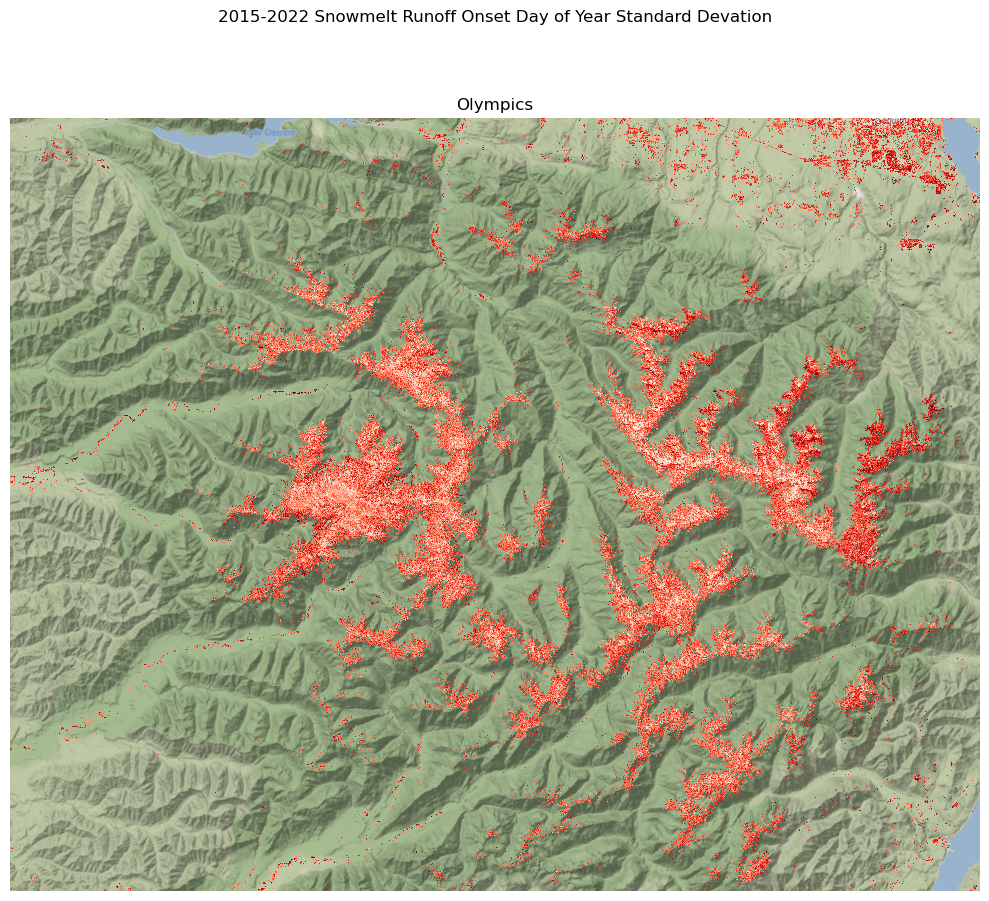

In [7]:
f,ax = plt.subplots(figsize=(10,10))

for nm in names:
    filename = glob.glob(f'../output/{nm}/*allyears_std*.tif')
    plots = rxr.open_rasterio(filename[0])
    plots.plot(ax=ax,cmap='Reds',vmin=0,vmax=100,add_colorbar=False)
    ax.set_title(f'{nm}')
    ax.set_aspect('equal')
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.axis('off')
    ctx.add_basemap(ax=ax, crs=plots.rio.crs, source=ctx.providers.Stamen.Terrain, attribution=False)
f.suptitle(f'2015-2022 Snowmelt Runoff Onset Day of Year Standard Devation')
f.tight_layout()

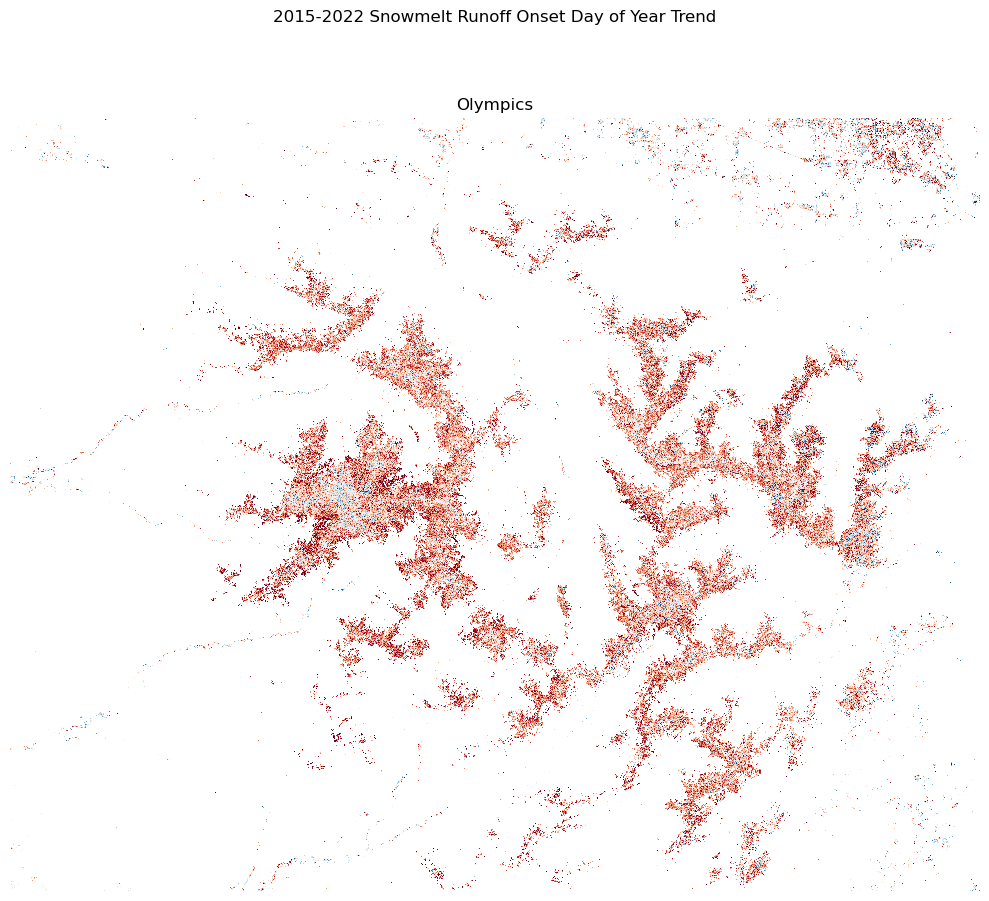

In [8]:
f,ax = plt.subplots(figsize=(10,10))

for nm in names:
    filename = glob.glob(f'../output/{nm}/*allyears_polyfit*.tif')
    plots = rxr.open_rasterio(filename[0])
    plots.plot(ax=ax,cmap='RdBu',vmin=-20,vmax=20,add_colorbar=False)
    ax.set_title(f'{nm}')
    ax.set_aspect('equal')
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.axis('off')
    #ctx.add_basemap(ax=axs, crs=plots.rio.crs, source=ctx.providers.Stamen.Terrain, attribution=False)
f.suptitle(f'2015-2022 Snowmelt Runoff Onset Day of Year Trend')
f.tight_layout()

In [ ]:
f,ax = plt.subplots(figsize=(10,10))

for nm in names:
    print(f'Processing {nm}...')
    geotiff_list = glob.glob(f'../output/{nm}/runoff_onset_*_2*.tif')
    year_list = []
    for geotiff in geotiff_list:
        year_list.append(re.search("([0-9]{4})", geotiff).group(0))
    year_list = [int(year) for year in year_list]

    #Create variable used for time axis
    time_var = xr.Variable('time', year_list)

    # Load in and concatenate all individual GeoTIFFs
    runoffs_allyears = xr.concat([rxr.open_rasterio(i) for i in geotiff_list],dim=time_var).squeeze().sortby('time')
    
    filename_dem = glob.glob(f'../output/{nm}/*dem*.tif')
    dem = rxr.open_rasterio(filename_dem[0]).squeeze().where(runoffs_allyears.isel(time=0)>-1)
    dem = dem.where(dem>1250)
    runoffs_allyears = runoffs_allyears.where(dem>1250)
    
    color = iter(cm.Blues(np.linspace(0.2, 0.99, 8)))

    year_list.sort()
    for year in year_list:
        median_runoff = runoffs_allyears[runoffs_allyears.time==year]
        dem_and_runoff_df = pd.DataFrame((dem.data.reshape(-1),median_runoff.data.reshape(-1))).T.dropna()
        dem_and_runoff_df.columns = ['Elevation','Runoff DOY']
        c = next(color)
        dem_and_runoff_df.groupby(pd.qcut(dem_and_runoff_df["Elevation"], 10)).median().plot(ax=ax,x='Runoff DOY',y='Elevation',label=f'{year}',c=c)
        axs.set_title(f'{nm}')
f.suptitle(f'Elevation vs. Runoff Date')
f.tight_layout()

Processing Olympics...
